# DCGAN: Deep Convolutional Generative Adversarial Network Project

Project 5:Use Generative Adversarial Networks (GAN)  to build the project. Submit your project as Jupyter notebook

Alfonso Rocha

Created 03/03/2025

This project focuses on training a Deep Convolutional Generative Adversarial Network (DCGAN) to generate synthetic waffle images. The process includes loading and preprocessing a custom image dataset, building the generator and discriminator models, training them adversarially, and visualizing generated outputs over time. 64×64 pixel resolution is used for faster training. 

# Table of Contents

- [Import Required System Files](#Import-Required-System-Files:)
- [1. Data Loading and Structure](#1.-Data-Loading-and-Structure)
- [2. Plot Images](#2.-Plot-Images)
- [3. Model Building](#3.-Model-Building)
- [4. Train Model](#4.-Train-Model)
- [5. Evaluating GAN Performance](#5.-Evaluating-GAN-Performance)
- [6. Conclusions](#6.-Conclusions)

### Import Required System Files:

#### Import all required libraries for data loading, preprocessing, modeling, and visualization
#### Includes TensorFlow/Keras, NumPy, Matplotlib, Scikit-learn, PIL, etc.

In [1]:
from pathlib import Path
from sklearn.preprocessing import StandardScaler
import numpy as np
import pandas as pd 
import os
from shutil import copyfile
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
from itertools import chain
import random
%matplotlib inline 
from matplotlib.image import imread
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import img_to_array, load_img
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import layers, models, regularizers, Input
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score
from tensorflow.keras.layers import Lambda
from tensorflow.keras.preprocessing.image import ImageDataGenerator


## 1. Data Loading and Structure
#### We start by exploring the dataset.

#### This code loads waffle images from a folder, resizes them to 64×64, and normalizes the pixel values to a range of -1 to 1. The processed images are stored in a NumPy array, and the total number of loaded images is printed.
#### This prints 954 images of size 64×64 with 3 color channels (RGB) were loaded into memory.

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from glob import glob
import tensorflow as tf
from tensorflow.keras import layers

# --- Config ---
image_dir = r"C:\Users\alfon\.cache\kagglehub\datasets\kmader\food41\versions\5\images\waffles"

def load_images_from_folder(folder, image_size=(64, 64), max_images=None):
    image_paths = glob(os.path.join(folder, "*.jpg"))
    if max_images:
        image_paths = image_paths[:max_images]

    all_images = []
    for path in image_paths:
        img = Image.open(path).convert("RGB")
        img = img.resize(image_size)
        img = np.array(img)
        img = (img - 127.5) / 127.5  # Normalize to [-1, 1]
        all_images.append(img)

    return np.array(all_images)

# Load images
images = load_images_from_folder(image_dir)
print(f"Loaded {images.shape[0]} images of shape {images.shape[1:]}")

Loaded 954 images of shape (64, 64, 3)


#### This code sets a fixed random seed across NumPy, Python, and TensorFlow
#### to make results consistent every time the code is run.
#### This helps ensure reproducibility during training and data handling.

In [24]:
# Setting seed values for reproducibility across different libraries
random_seed = 42

# This ensures that any random operations using numpy (like array shuffling, random sampling)
# will produce the same results each time the code is run
np.random.seed(random_seed)

# This affects operations like random.choice(), random.shuffle(), etc.
# to produce consistent results between runs
random.seed(random_seed)

# This ensures reproducible behavior in neural network operations like:
# - Weight initialization
# - Dropout mask generation
# - Any stochastic processes in training
tf.random.set_seed(random_seed)

## 2. Plot Images

#### This function displays the first few images from the loaded dataset.
#### It reverses the normalization to bring pixel values back to the 0–255 range,
#### and shows the selected images in a grid layout using matplotlib.

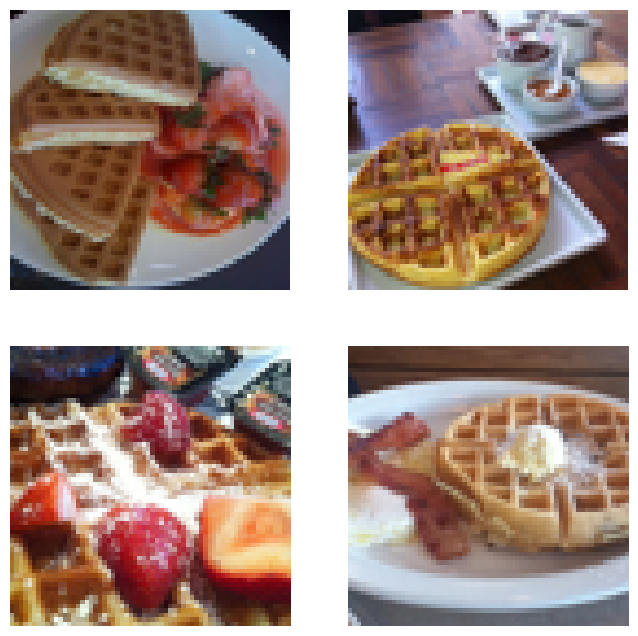

In [4]:
def show_images(images, num=4):
    plt.figure(figsize=(8, 8))
    for i in range(num):
        plt.subplot(2, 2, i+1)
        img = (images[i] * 127.5 + 127.5).astype(np.uint8)  # denormalize
        plt.imshow(img)
        plt.axis("off")
    plt.show()

# Show 4 images
show_images(images)

## 3. Model Building
#### This section provides an overview of our Generative Adversarial Network. We built a generator and discriminator. 
#### This code defines the loss functions and optimizers for training the GAN, using binary cross-entropy and Adam optimizers for both the generator and discriminator.

In [5]:
def build_generator():
    inputs = tf.keras.Input(shape=(100,))  # noise vector

    x = layers.Dense(8 * 8 * 128, use_bias=False)(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)

    x = layers.Reshape((8, 8, 128))(x)

    x = layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)

    x = layers.Conv2DTranspose(32, (5, 5), strides=(2, 2), padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)

    outputs = layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh')(x)

    return tf.keras.Model(inputs, outputs, name="generator")

generator = build_generator()
generator.summary()

Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 8192)           │       819,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 8192)           │        32,768 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 16, 16, 64)     │       204,800 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 16, 16, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 32, 32, 32)     │        51,200 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 64, 64, 3)      │         2,400 │
│ (Conv2DTranspose)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,110,752 (4.24 MB)

 Trainable params: 1,094,176 (4.17 MB)

 Non-trainable params: 16,576 (64.75 KB)

In [6]:
def build_discriminator():
    inputs = tf.keras.Input(shape=(64, 64, 3))

    x = layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same')(inputs)  # → 32x32x64
    x = layers.LeakyReLU()(x)
    x = layers.Dropout(0.3)(x)

    x = layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same')(x)  # → 16x16x128
    x = layers.LeakyReLU()(x)
    x = layers.Dropout(0.3)(x)

    x = layers.Conv2D(192, (5, 5), strides=(2, 2), padding='same')(x)  # → 8x8x192
    x = layers.LeakyReLU()(x)
    x = layers.Dropout(0.3)(x)

    x = layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same')(x)  # → 4x4x128
    x = layers.LeakyReLU()(x)
    x = layers.Dropout(0.3)(x)

    x = layers.Flatten()(x)  # 4*4*128 = 2048
    x = layers.Dense(64)(x)
    x = layers.LeakyReLU()(x)

    outputs = layers.Dense(1, activation='sigmoid')(x)

    return tf.keras.Model(inputs, outputs, name="discriminator")

# Build and summarize
discriminator = build_discriminator()
discriminator.summary()


Model: "discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 64, 64, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 32, 32, 64)     │         4,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 16, 16, 128)    │       204,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 8, 8, 192)      │       614,592 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_5 (LeakyReLU)       │ (None, 8, 8, 192)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 8, 8, 192)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 4, 4, 128)      │       614,528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_6 (LeakyReLU)       │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │       131,136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_7 (LeakyReLU)       │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,570,113 (5.99 MB)

 Trainable params: 1,570,113 (5.99 MB)

 Non-trainable params: 0 (0.00 B)

In [7]:
cross_entropy = tf.keras.losses.BinaryCrossentropy()

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

## 4. Train Model
#### This section prepares and executes the full GAN training process.
#### The training loop updates both the generator and discriminator, applies label smoothing, and tracks their respective losses over time. To visually monitor progress, the generator produces sample images every 30 epochs using a fixed input seed.

#### Generates and displays sample images from the generator using a fixed seed.
#### Shows visual progress during training by plotting 8 generated images per call.

In [8]:
def generate_and_plot_images(model, epoch, test_input):
    predictions = model(test_input, training=False)
    
    plt.figure(figsize=(20, 4))  # 1 row x 8 columns

    for i in range(min(8, predictions.shape[0])):
        plt.subplot(1, 8, i + 1)
        img = (predictions[i] * 127.5 + 127.5).numpy().astype(np.uint8)
        plt.imshow(img)
        plt.axis('off')

    plt.suptitle(f"Epoch {epoch}")
    plt.tight_layout()
    plt.show()

#### Sets training parameters and defines one training step for the GAN.
#### Trains generator and discriminator using noise input and real images, applying label smoothing.

In [9]:
BATCH_SIZE = 32
EPOCHS = 3000
noise_dim = 100
num_examples_to_generate = 16
seed = tf.random.normal([num_examples_to_generate, noise_dim])

# Create dataset
train_dataset = tf.data.Dataset.from_tensor_slices(images).shuffle(1000).batch(BATCH_SIZE)

@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

                # Apply label smoothing
        real_labels = tf.ones_like(real_output) * 0.9  # smoothed real labels
        fake_labels = tf.zeros_like(fake_output)       # fake labels stay the same

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss

#### Trains the GAN over 3000 epochs and tracks loss history.
#### Generates and displays images every 30 epochs to monitor progress visually.

Epoch 0, Gen Loss: 4.0710, Disc Loss: 0.0772


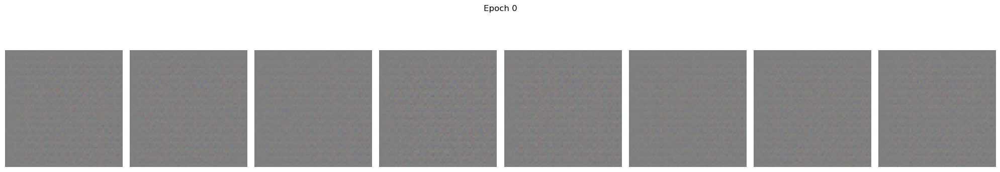

Epoch 30, Gen Loss: 10.8942, Disc Loss: 0.0227


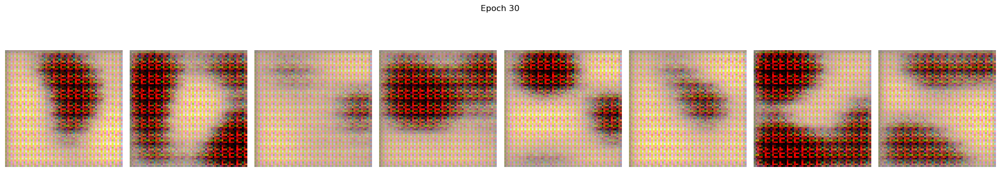

Epoch 60, Gen Loss: 3.6133, Disc Loss: 0.1139


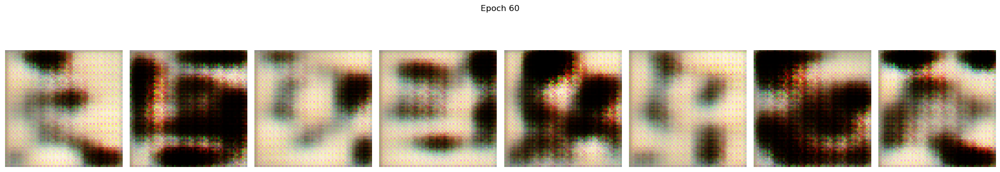

Epoch 90, Gen Loss: 5.2176, Disc Loss: 0.0643


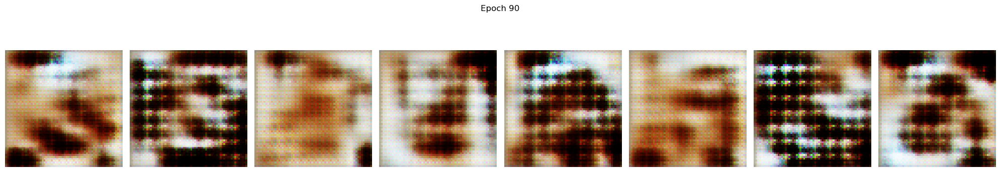

Epoch 120, Gen Loss: 3.9497, Disc Loss: 0.1303


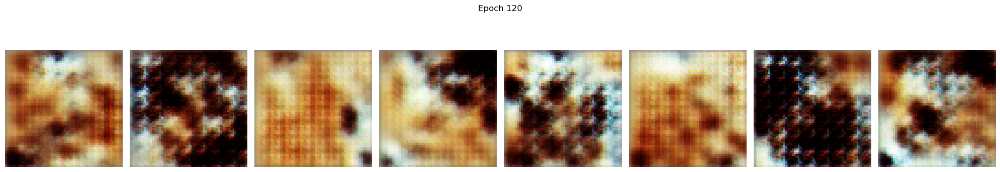

Epoch 150, Gen Loss: 5.1473, Disc Loss: 0.1428


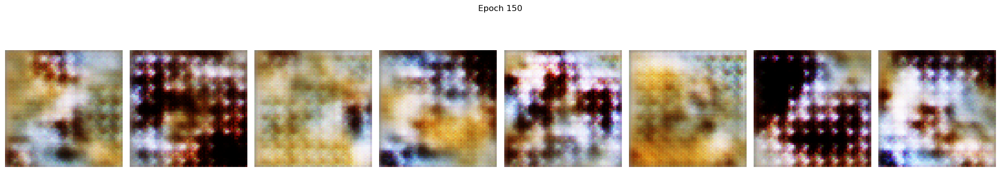

Epoch 180, Gen Loss: 7.7835, Disc Loss: 0.0123


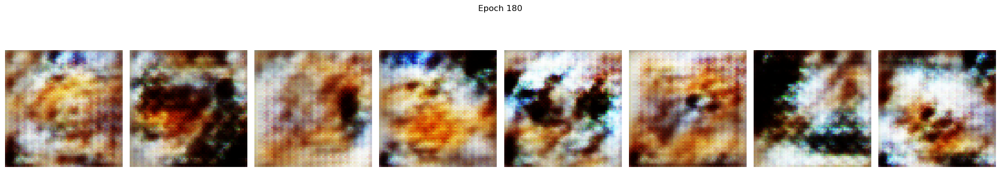

Epoch 210, Gen Loss: 7.8491, Disc Loss: 0.7153


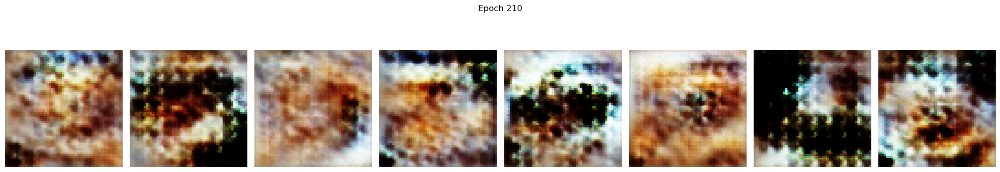

Epoch 240, Gen Loss: 6.3784, Disc Loss: 0.0498


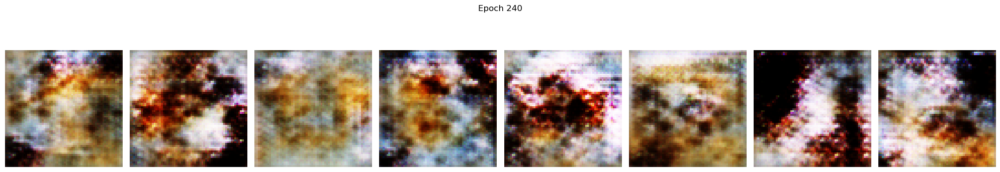

Epoch 270, Gen Loss: 5.7940, Disc Loss: 0.1568


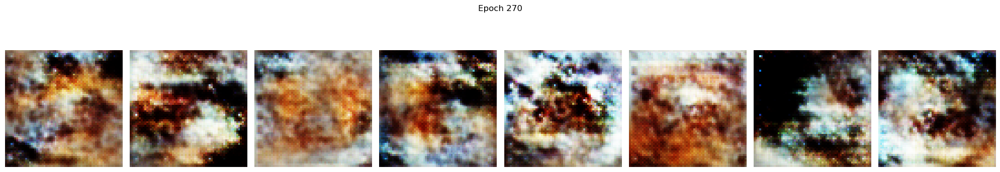

Epoch 300, Gen Loss: 7.0484, Disc Loss: 0.1880


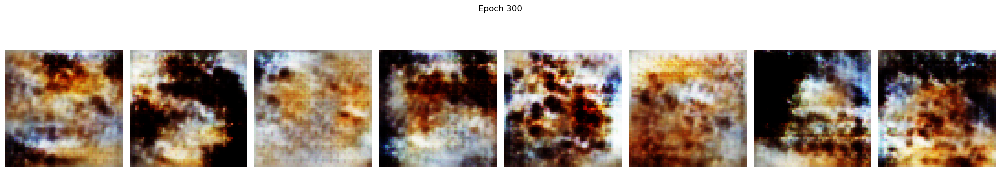

Epoch 330, Gen Loss: 7.5554, Disc Loss: 0.0665


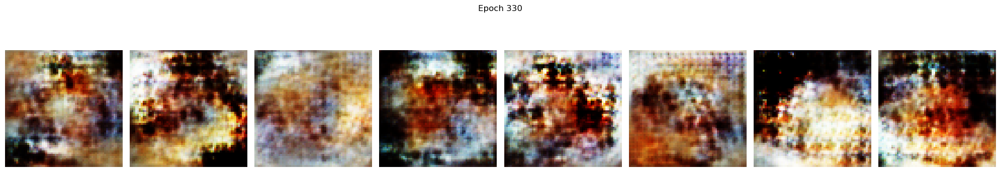

Epoch 360, Gen Loss: 6.2266, Disc Loss: 0.0248


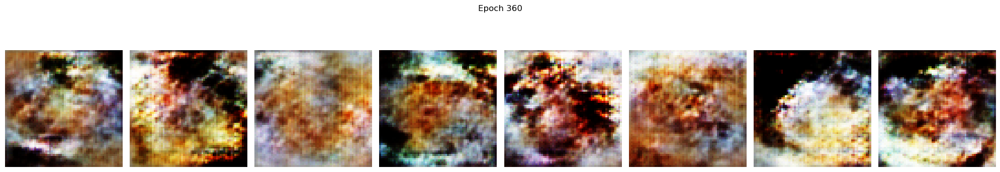

Epoch 390, Gen Loss: 8.4980, Disc Loss: 0.3263


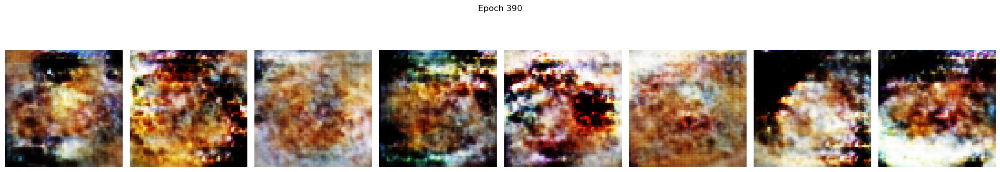

Epoch 420, Gen Loss: 7.2072, Disc Loss: 0.1004


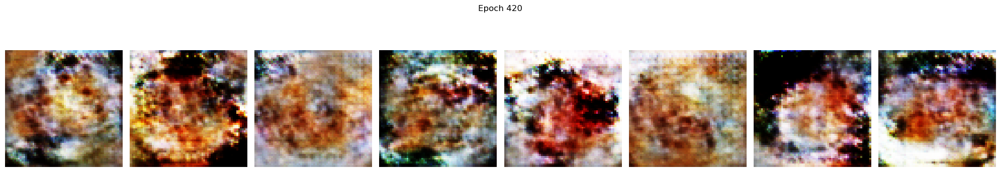

Epoch 450, Gen Loss: 7.4377, Disc Loss: 0.0713


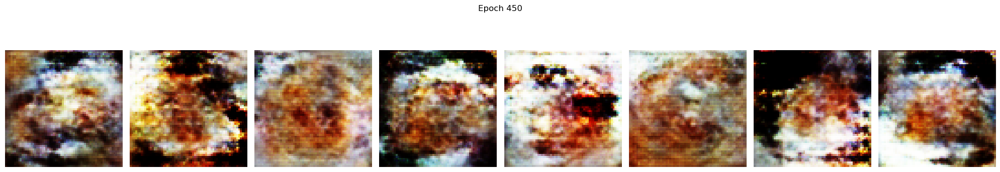

Epoch 480, Gen Loss: 5.1940, Disc Loss: 0.2549


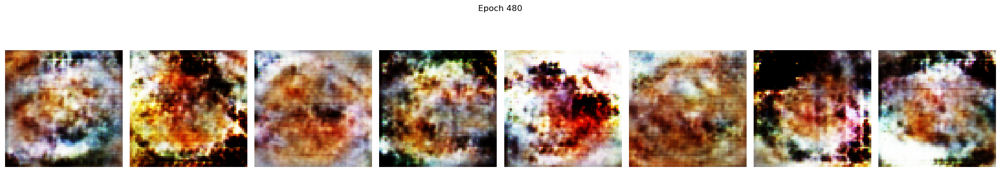

Epoch 510, Gen Loss: 4.9856, Disc Loss: 0.2059


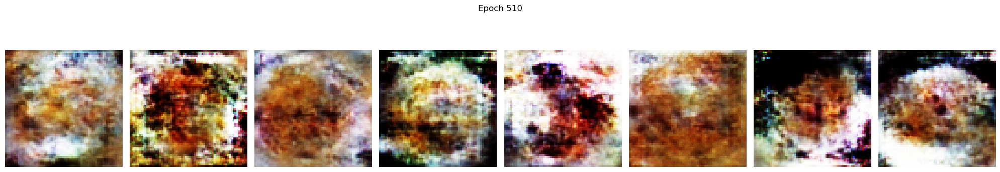

Epoch 540, Gen Loss: 4.7412, Disc Loss: 0.2002


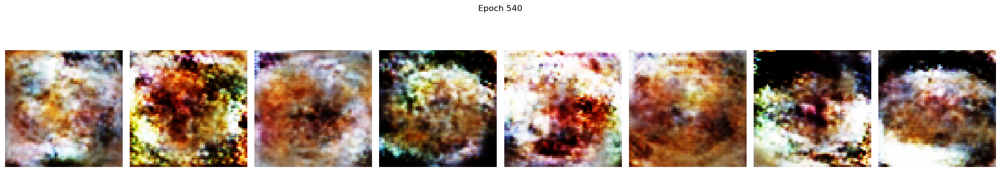

Epoch 570, Gen Loss: 6.8546, Disc Loss: 0.1409


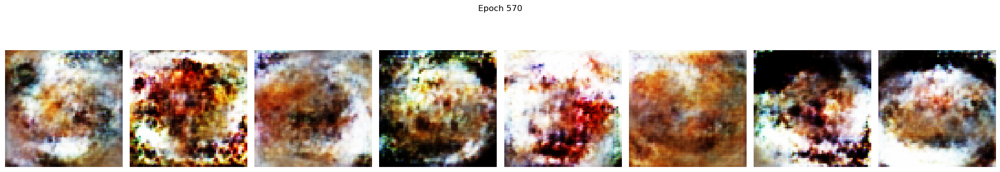

Epoch 600, Gen Loss: 6.9778, Disc Loss: 0.7256


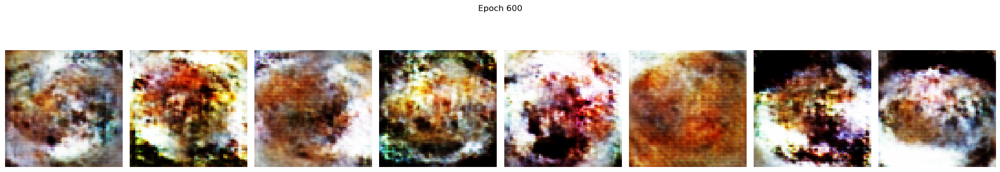

Epoch 630, Gen Loss: 6.4664, Disc Loss: 0.1286


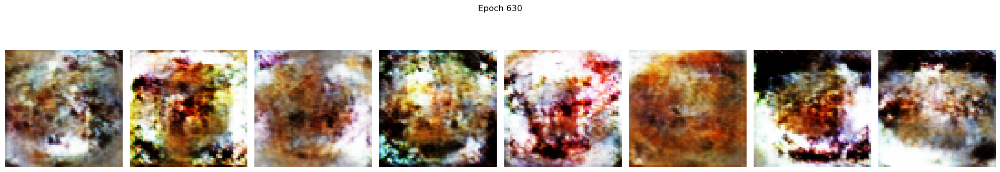

Epoch 660, Gen Loss: 6.3279, Disc Loss: 0.2624


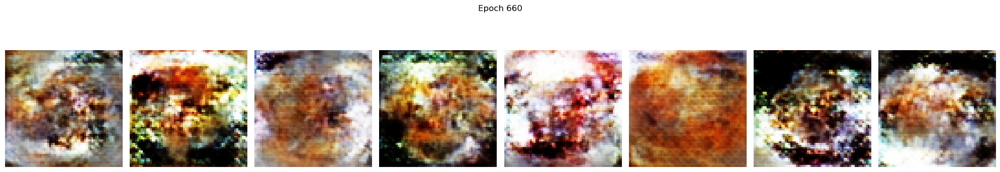

Epoch 690, Gen Loss: 5.6355, Disc Loss: 0.0828


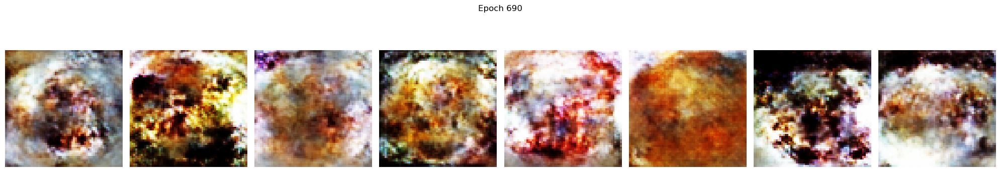

Epoch 720, Gen Loss: 5.1512, Disc Loss: 0.1232


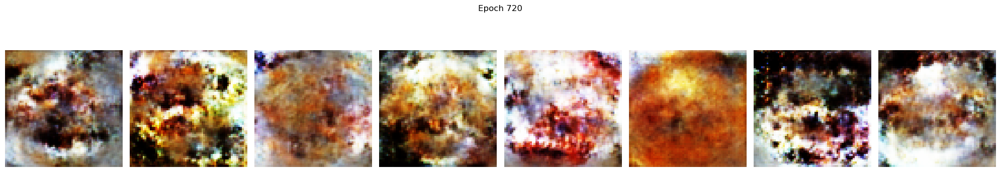

Epoch 750, Gen Loss: 7.0510, Disc Loss: 0.1001


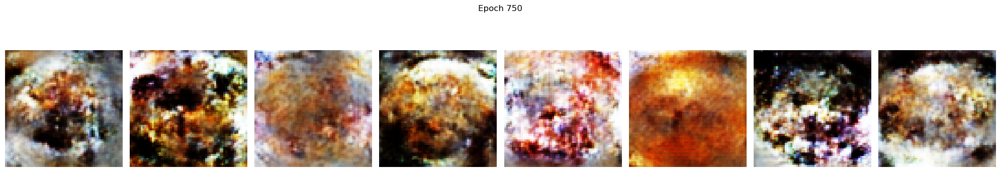

Epoch 780, Gen Loss: 5.1096, Disc Loss: 0.4929


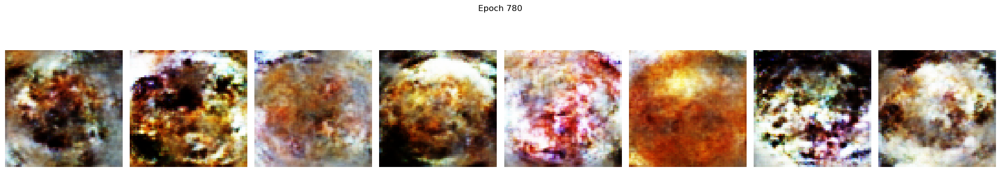

Epoch 810, Gen Loss: 5.7583, Disc Loss: 0.1826


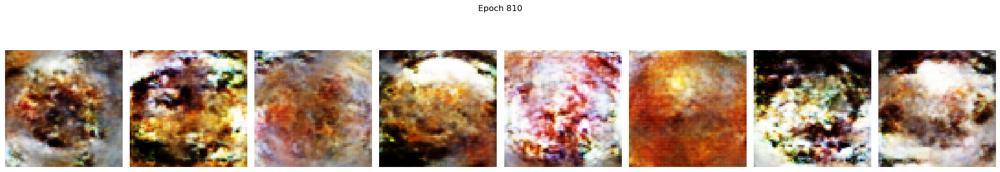

Epoch 840, Gen Loss: 5.8976, Disc Loss: 0.3027


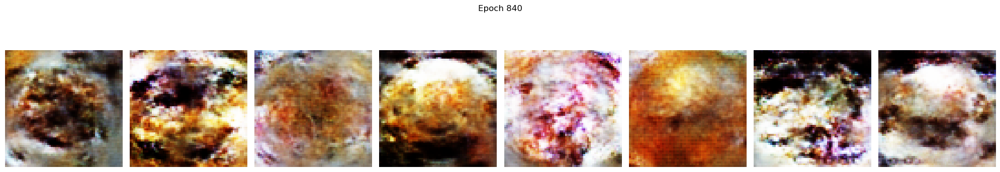

Epoch 870, Gen Loss: 6.9761, Disc Loss: 0.1497


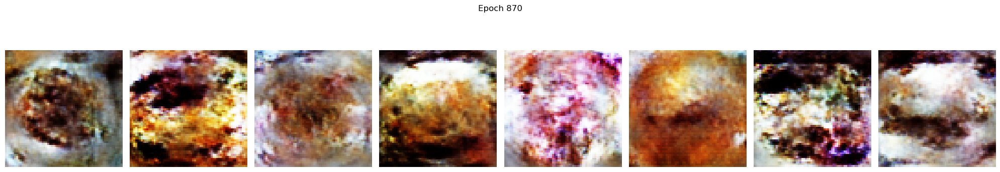

Epoch 900, Gen Loss: 6.3537, Disc Loss: 0.1209


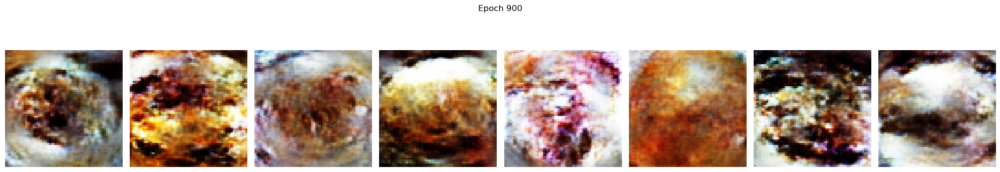

Epoch 930, Gen Loss: 6.3662, Disc Loss: 0.1748


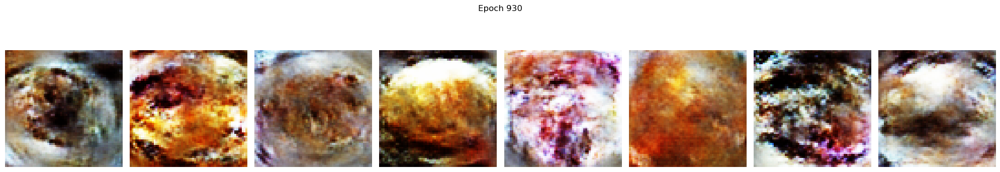

Epoch 960, Gen Loss: 4.3071, Disc Loss: 0.1752


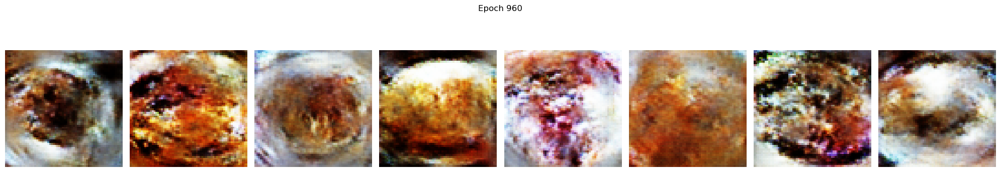

Epoch 990, Gen Loss: 7.0547, Disc Loss: 0.6229


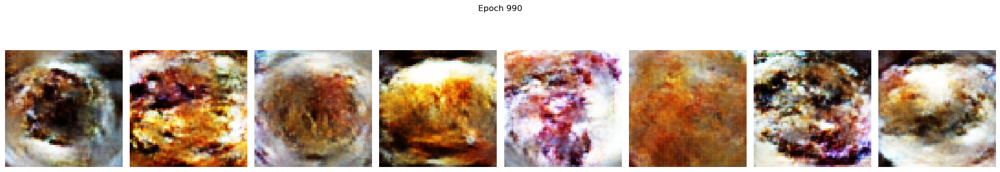

Epoch 1020, Gen Loss: 5.4345, Disc Loss: 0.1021


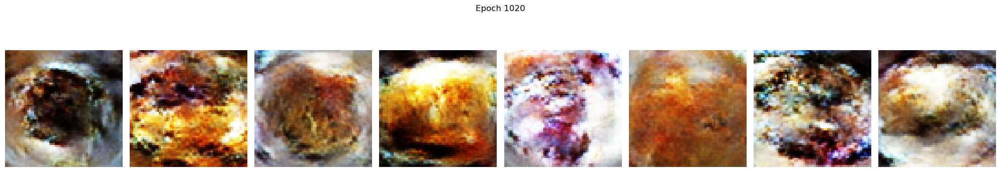

Epoch 1050, Gen Loss: 6.6636, Disc Loss: 0.0473


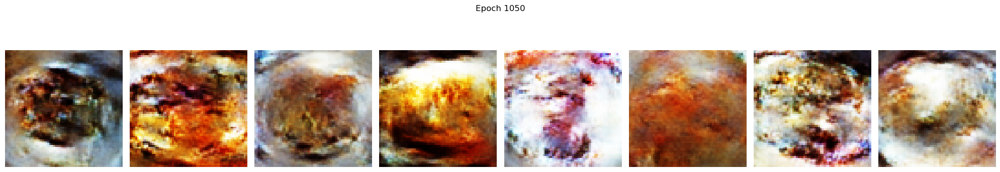

Epoch 1080, Gen Loss: 5.6001, Disc Loss: 0.2513


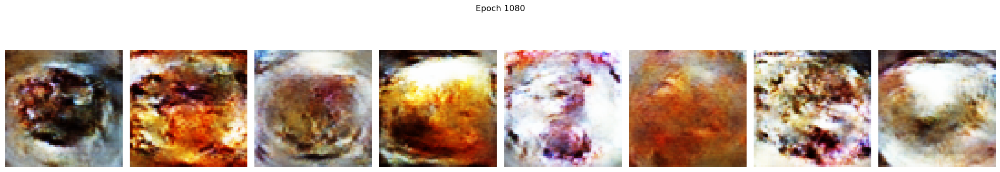

Epoch 1110, Gen Loss: 4.7334, Disc Loss: 0.1856


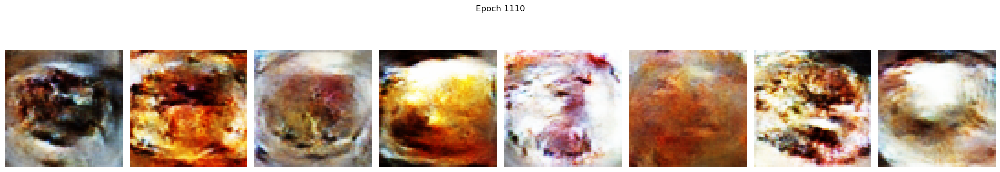

Epoch 1140, Gen Loss: 5.9192, Disc Loss: 0.1114


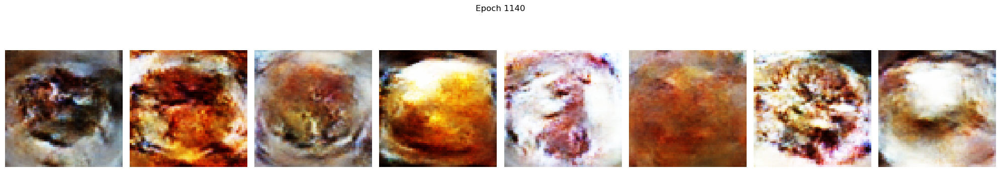

Epoch 1170, Gen Loss: 4.9813, Disc Loss: 0.0686


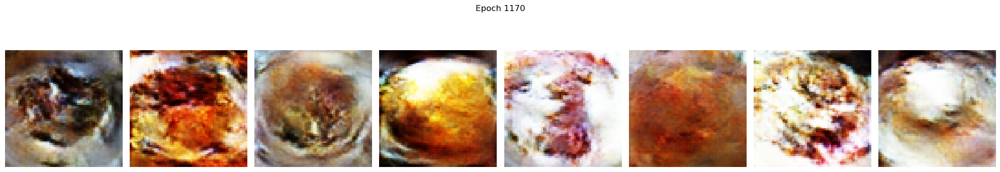

Epoch 1200, Gen Loss: 5.4035, Disc Loss: 0.0311


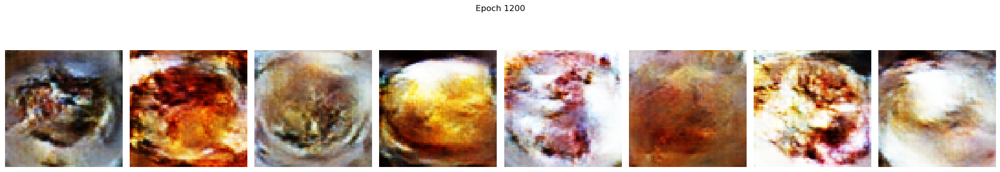

Epoch 1230, Gen Loss: 6.5031, Disc Loss: 0.0542


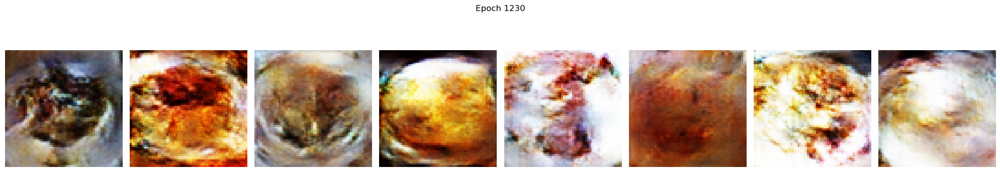

Epoch 1260, Gen Loss: 5.9484, Disc Loss: 0.2093


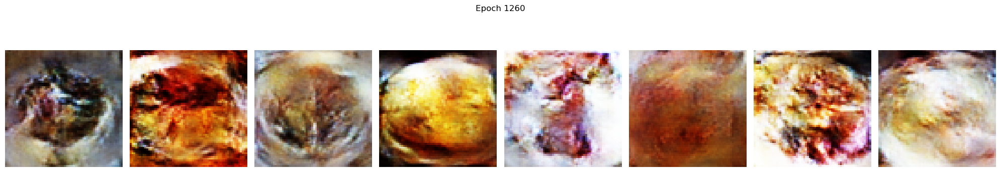

Epoch 1290, Gen Loss: 5.8686, Disc Loss: 0.0330


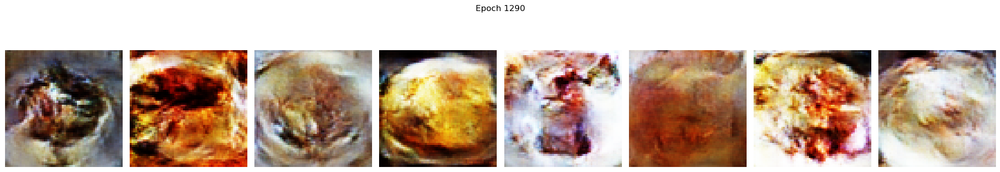

Epoch 1320, Gen Loss: 7.0581, Disc Loss: 0.0151


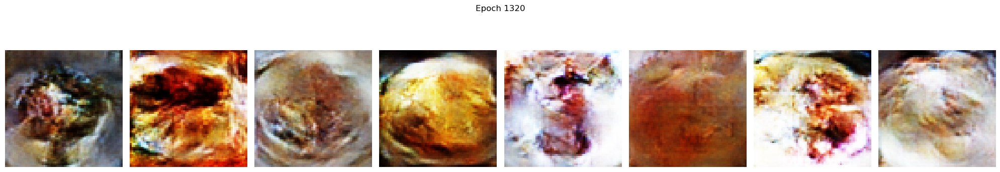

Epoch 1350, Gen Loss: 5.5483, Disc Loss: 0.1173


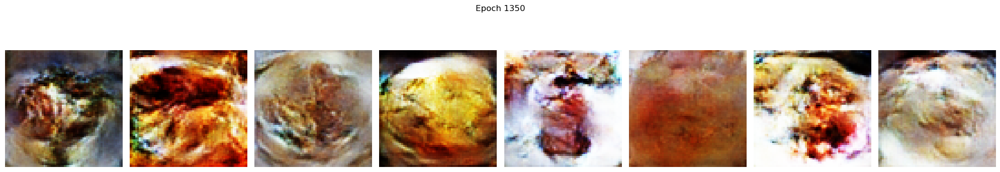

Epoch 1380, Gen Loss: 6.6671, Disc Loss: 0.0316


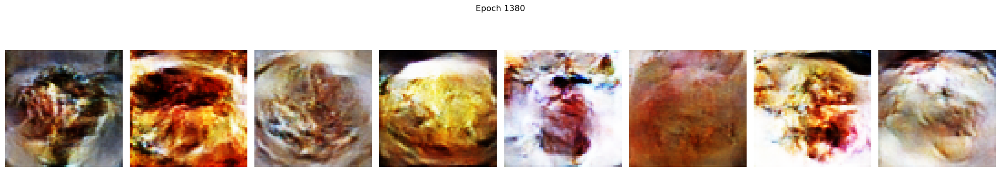

Epoch 1410, Gen Loss: 7.5255, Disc Loss: 0.2481


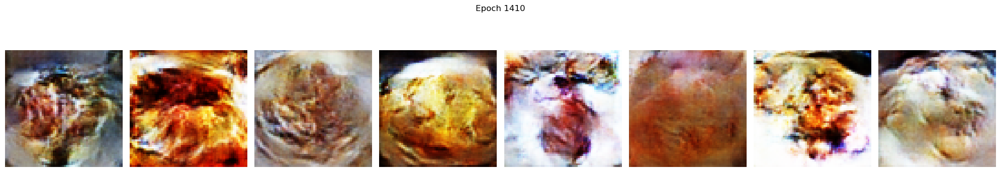

Epoch 1440, Gen Loss: 6.4840, Disc Loss: 0.2068


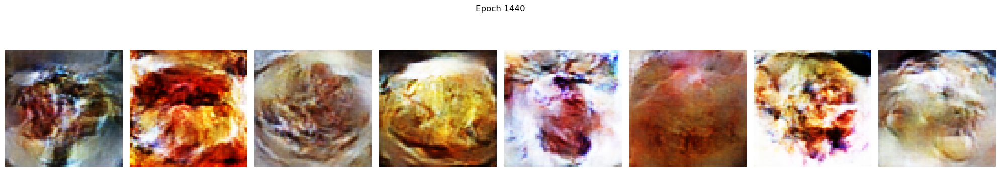

Epoch 1470, Gen Loss: 5.1683, Disc Loss: 0.1091


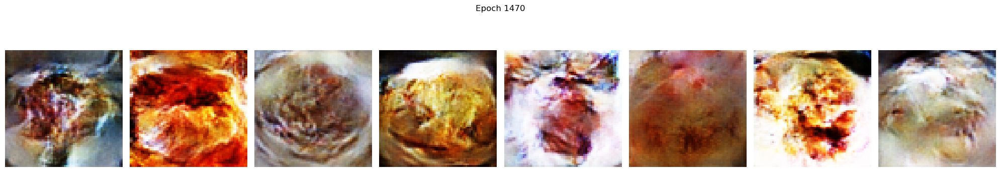

Epoch 1500, Gen Loss: 6.4742, Disc Loss: 0.1468


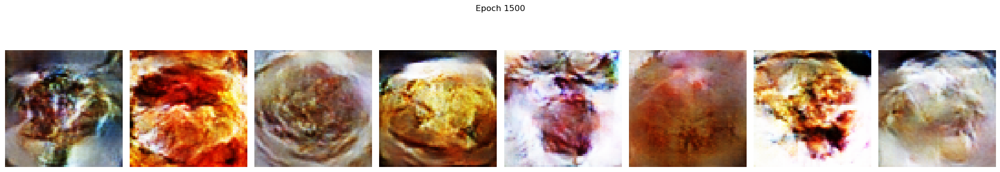

Epoch 1530, Gen Loss: 5.7652, Disc Loss: 0.0774


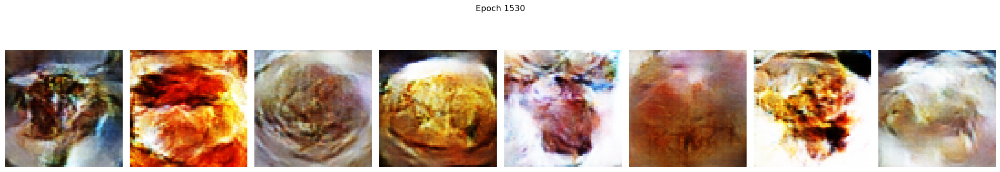

Epoch 1560, Gen Loss: 6.5447, Disc Loss: 0.0615


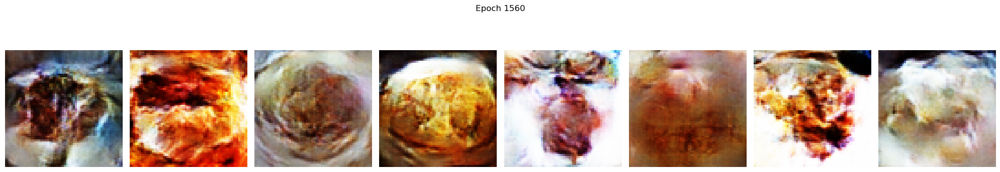

Epoch 1590, Gen Loss: 5.2071, Disc Loss: 0.1005


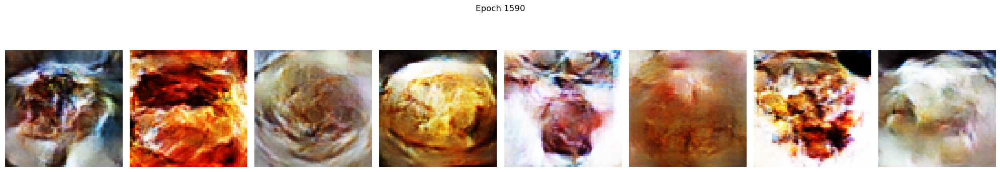

Epoch 1620, Gen Loss: 6.0022, Disc Loss: 0.0555


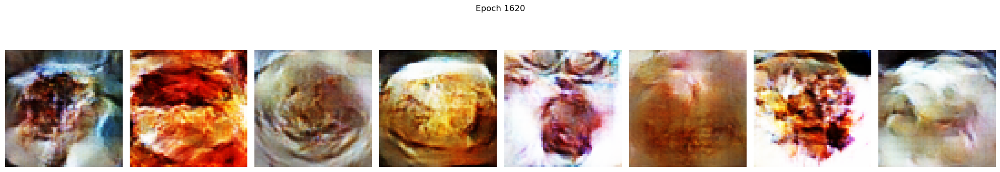

Epoch 1650, Gen Loss: 6.3546, Disc Loss: 0.1356


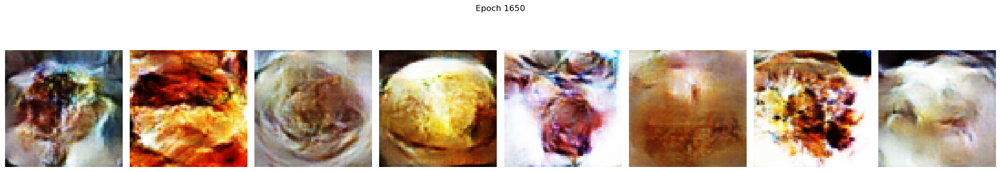

Epoch 1680, Gen Loss: 4.9060, Disc Loss: 0.0703


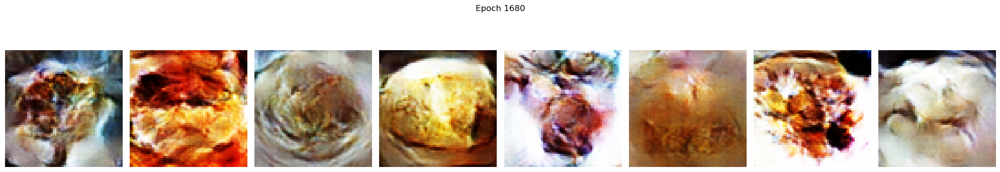

Epoch 1710, Gen Loss: 6.4984, Disc Loss: 0.1859


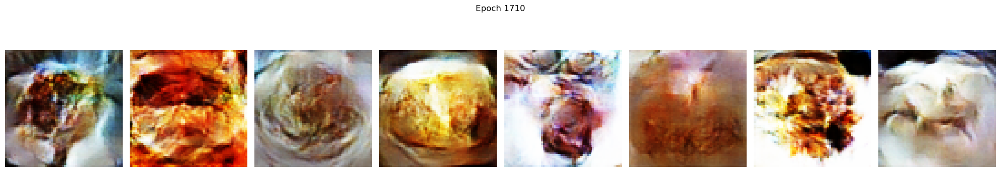

Epoch 1740, Gen Loss: 6.2430, Disc Loss: 0.0307


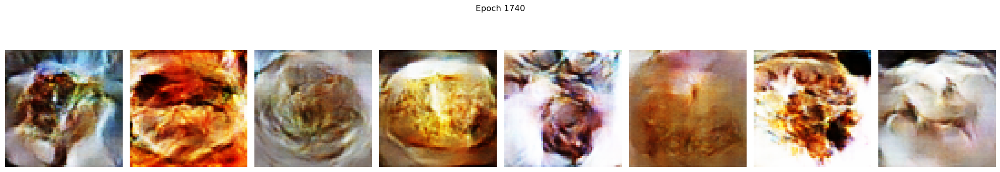

Epoch 1770, Gen Loss: 5.6087, Disc Loss: 0.0211


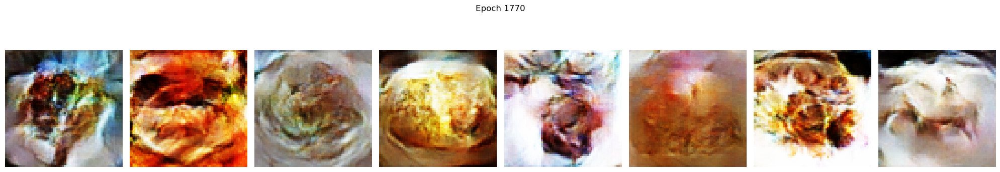

Epoch 1800, Gen Loss: 6.5692, Disc Loss: 0.0198


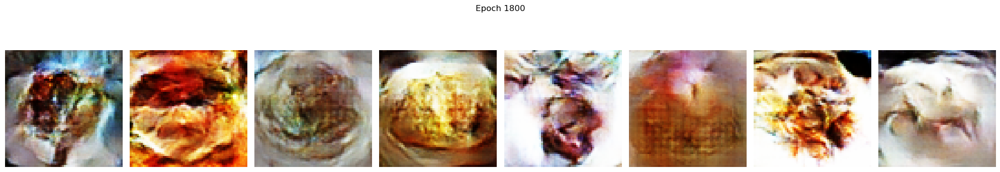

Epoch 1830, Gen Loss: 6.1817, Disc Loss: 0.0321


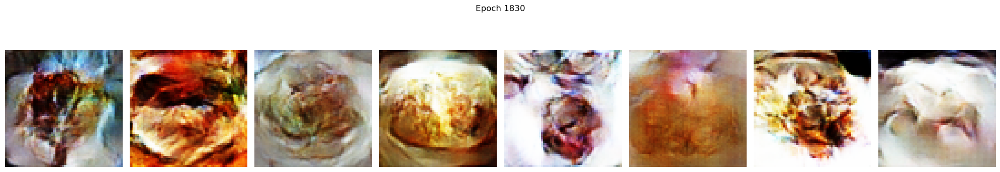

Epoch 1860, Gen Loss: 6.3583, Disc Loss: 0.1078


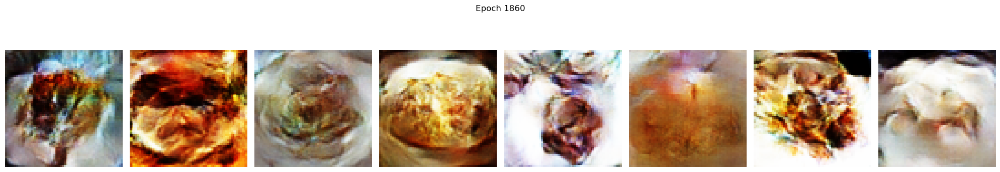

Epoch 1890, Gen Loss: 4.7299, Disc Loss: 0.2366


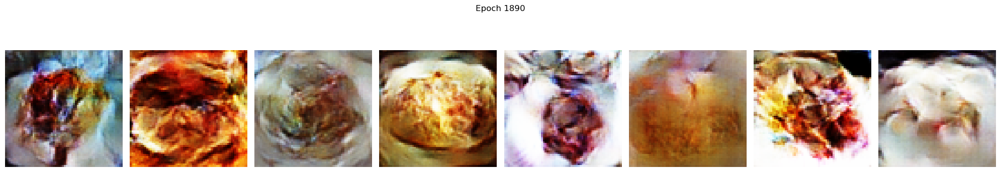

Epoch 1920, Gen Loss: 6.9800, Disc Loss: 0.0144


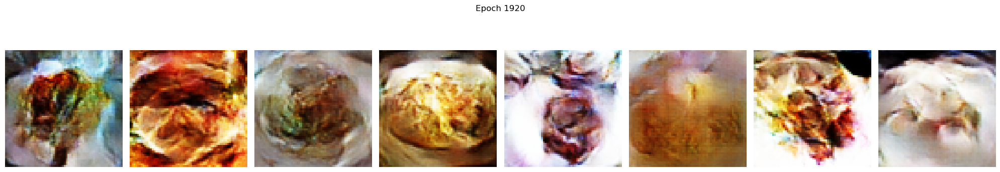

Epoch 1950, Gen Loss: 6.3460, Disc Loss: 0.1150


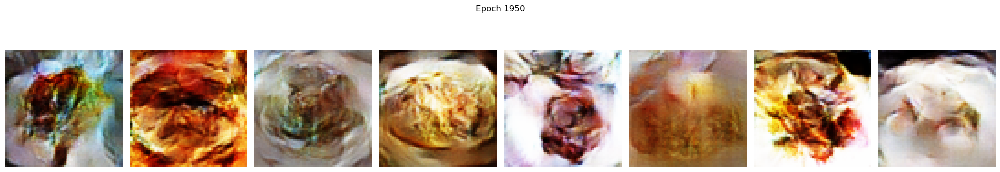

Epoch 1980, Gen Loss: 5.3553, Disc Loss: 0.2580


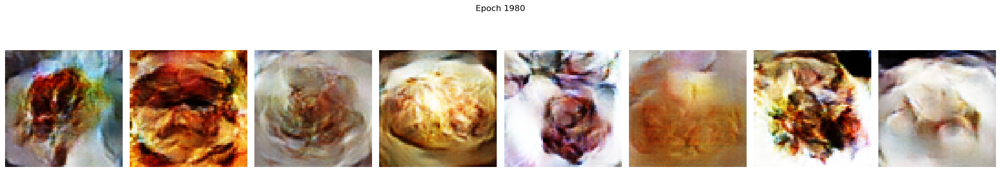

Epoch 2010, Gen Loss: 6.7360, Disc Loss: 0.4419


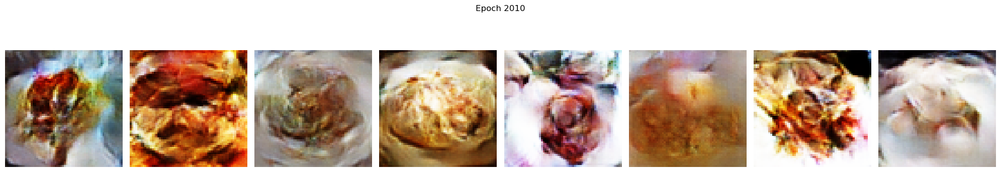

Epoch 2040, Gen Loss: 8.0045, Disc Loss: 0.0117


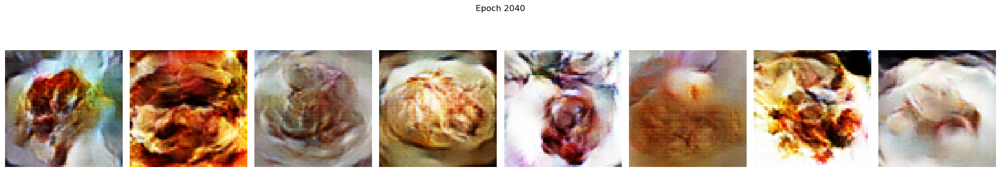

Epoch 2070, Gen Loss: 6.4581, Disc Loss: 0.0387


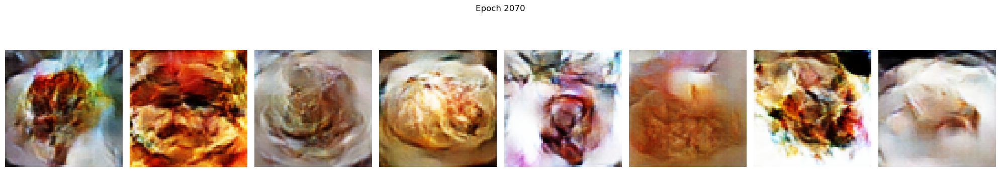

Epoch 2100, Gen Loss: 5.6140, Disc Loss: 0.1112


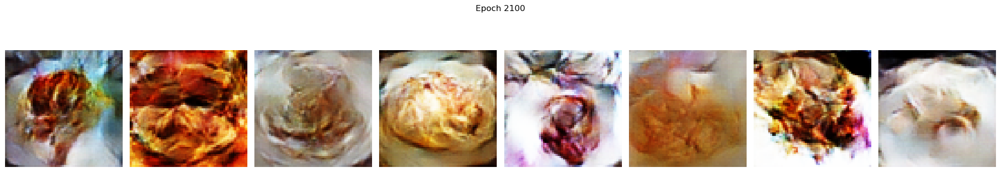

Epoch 2130, Gen Loss: 8.9438, Disc Loss: 0.5623


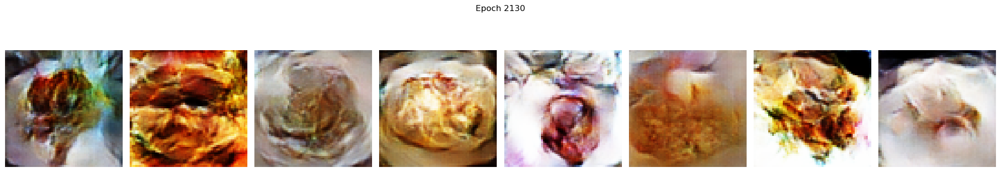

Epoch 2160, Gen Loss: 4.7567, Disc Loss: 0.1527


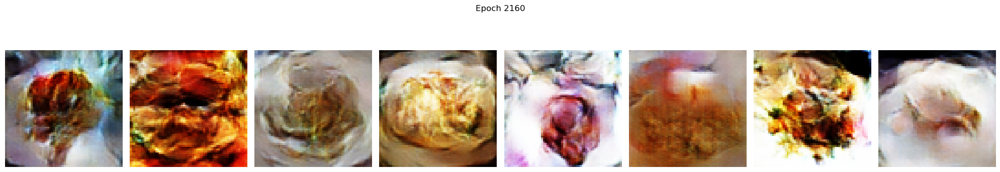

Epoch 2190, Gen Loss: 6.8423, Disc Loss: 0.1293


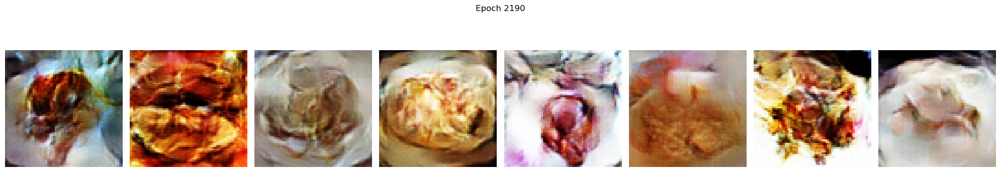

Epoch 2220, Gen Loss: 6.8418, Disc Loss: 0.1490


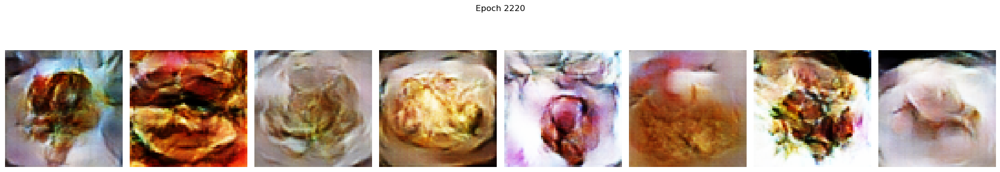

Epoch 2250, Gen Loss: 8.5539, Disc Loss: 0.1963


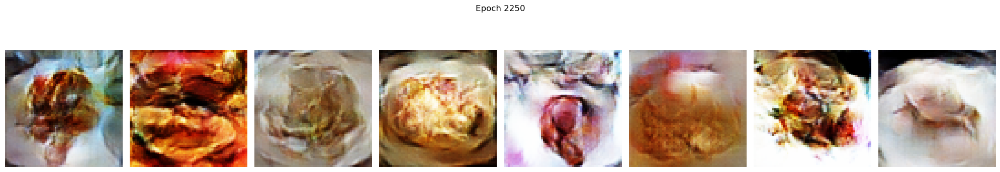

Epoch 2280, Gen Loss: 5.7232, Disc Loss: 0.2317


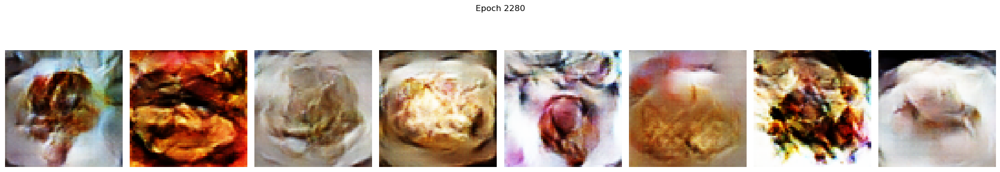

Epoch 2310, Gen Loss: 6.9850, Disc Loss: 0.0591


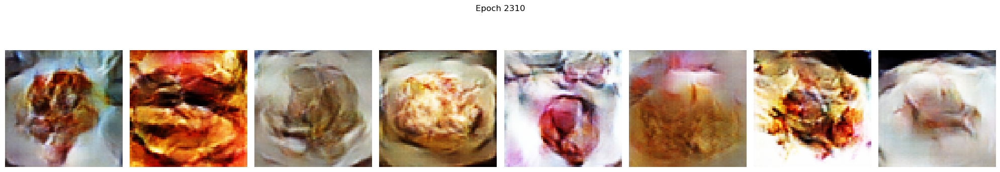

Epoch 2340, Gen Loss: 5.1107, Disc Loss: 0.1243


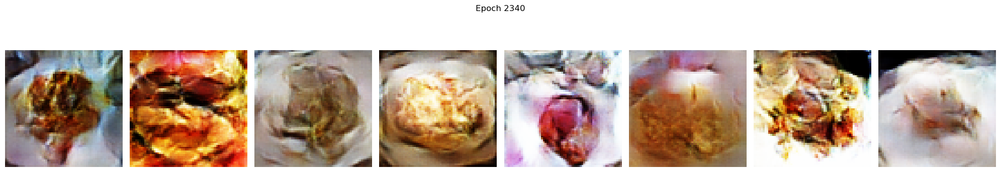

Epoch 2370, Gen Loss: 5.5488, Disc Loss: 0.0449


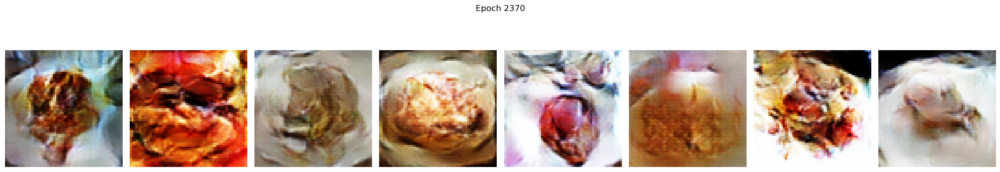

Epoch 2400, Gen Loss: 6.1469, Disc Loss: 0.0371


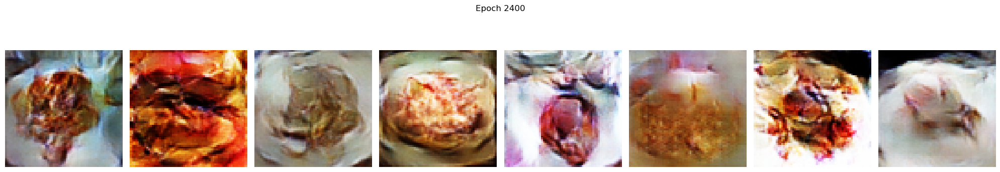

Epoch 2430, Gen Loss: 5.4709, Disc Loss: 0.1311


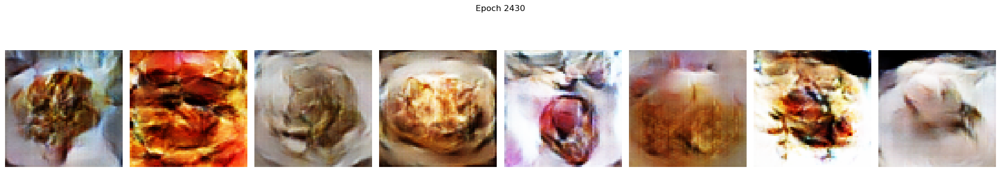

Epoch 2460, Gen Loss: 6.4268, Disc Loss: 0.0528


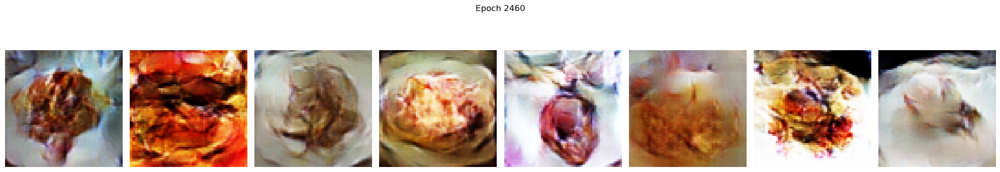

Epoch 2490, Gen Loss: 5.5162, Disc Loss: 0.1587


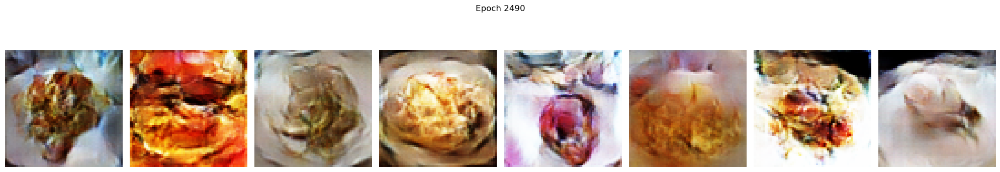

Epoch 2520, Gen Loss: 6.6551, Disc Loss: 0.2604


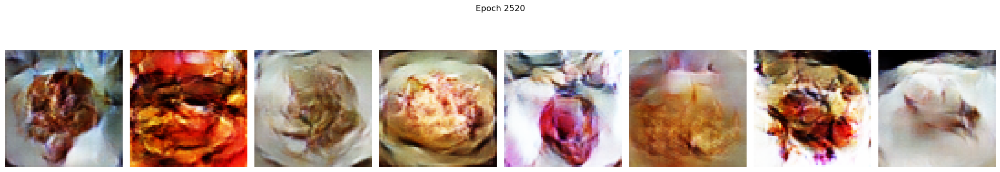

Epoch 2550, Gen Loss: 7.3557, Disc Loss: 0.0735


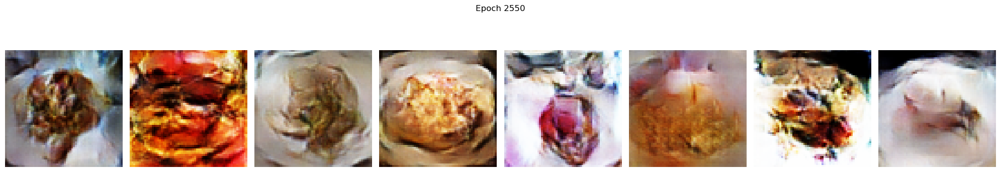

Epoch 2580, Gen Loss: 7.9969, Disc Loss: 0.1159


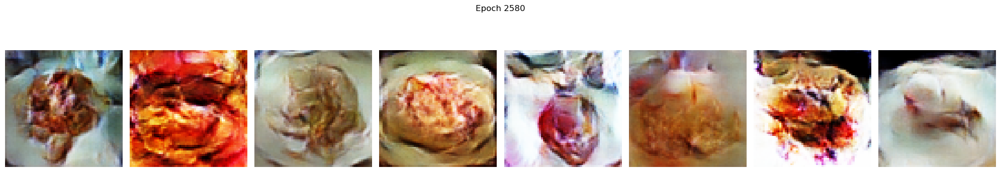

Epoch 2610, Gen Loss: 8.2796, Disc Loss: 0.0120


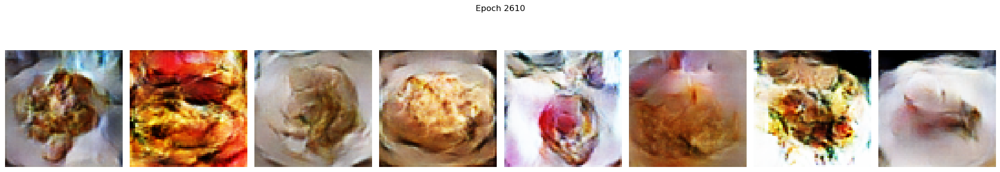

Epoch 2640, Gen Loss: 7.2179, Disc Loss: 0.0389


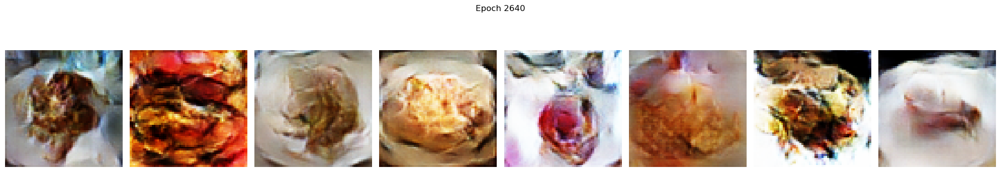

Epoch 2670, Gen Loss: 6.8261, Disc Loss: 0.0492


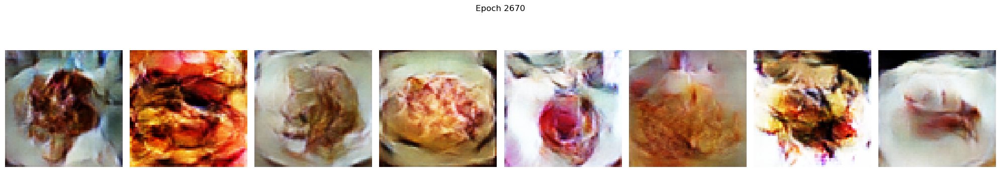

Epoch 2700, Gen Loss: 5.4675, Disc Loss: 0.0674


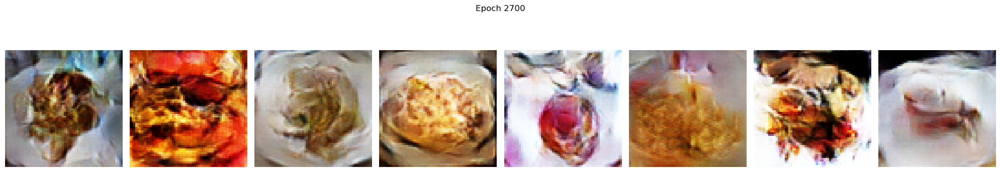

Epoch 2730, Gen Loss: 6.5703, Disc Loss: 0.1630


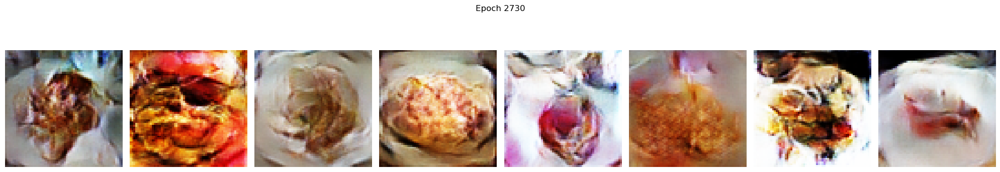

Epoch 2760, Gen Loss: 6.0107, Disc Loss: 0.1425


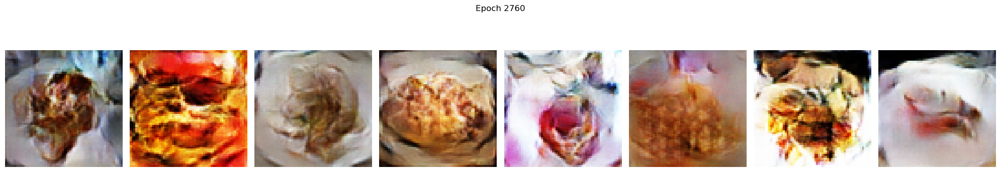

Epoch 2790, Gen Loss: 6.7525, Disc Loss: 0.0447


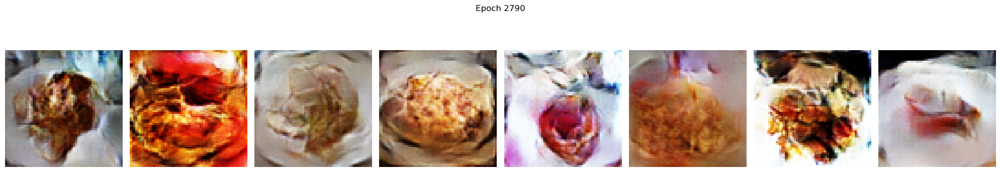

Epoch 2820, Gen Loss: 6.6347, Disc Loss: 0.1052


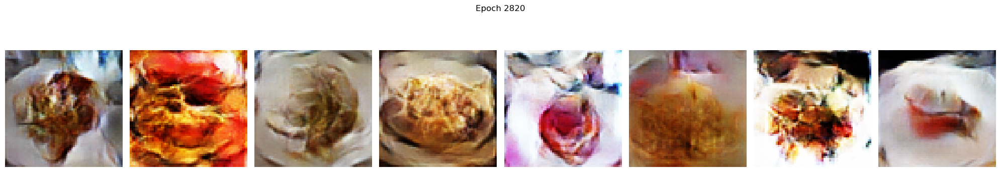

Epoch 2850, Gen Loss: 6.3044, Disc Loss: 0.0456


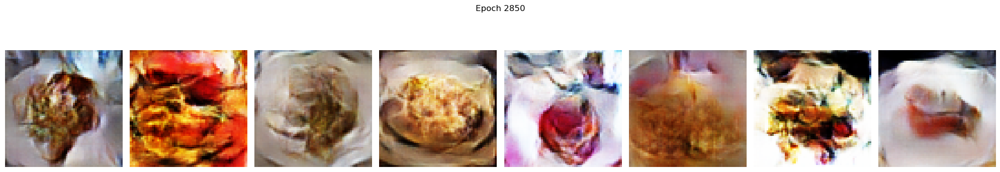

Epoch 2880, Gen Loss: 6.7613, Disc Loss: 0.0225


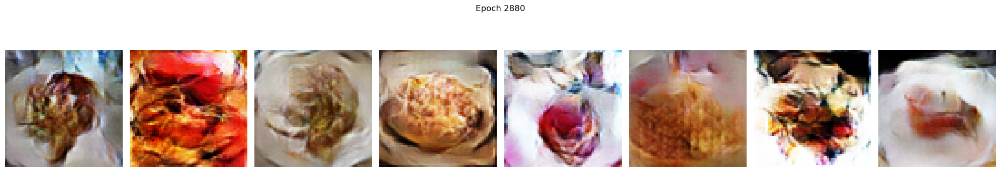

Epoch 2910, Gen Loss: 7.3389, Disc Loss: 0.0362


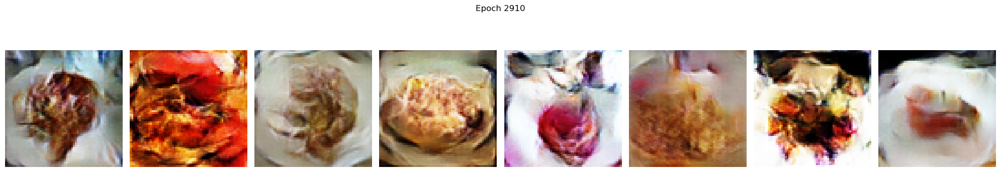

Epoch 2940, Gen Loss: 7.0087, Disc Loss: 0.0297


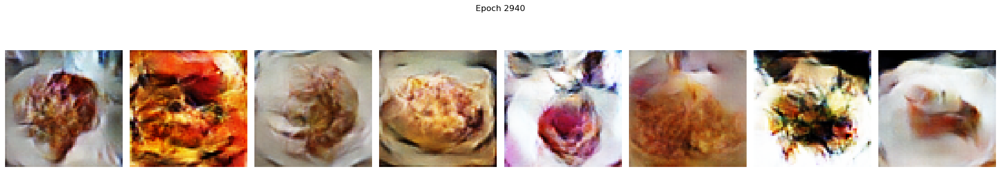

Epoch 2970, Gen Loss: 7.2778, Disc Loss: 0.0331


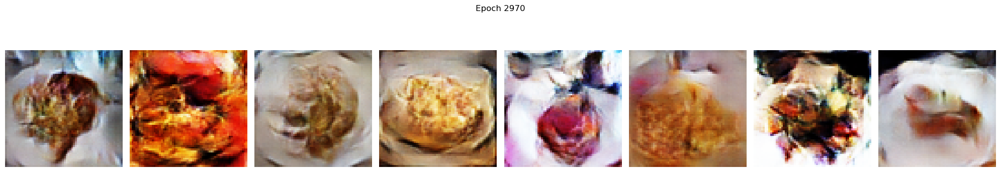

In [10]:
gen_history = []
disc_history = []
def train(dataset, epochs):
    for epoch in range(epochs):
        for image_batch in dataset:
            gen_loss, disc_loss = train_step(image_batch)

        gen_history.append(gen_loss.numpy())
        disc_history.append(disc_loss.numpy())

        if epoch % 30 == 0:
            print(f"Epoch {epoch}, Gen Loss: {gen_loss:.4f}, Disc Loss: {disc_loss:.4f}")
            generate_and_plot_images(generator, epoch, seed)

train(train_dataset, EPOCHS)

## 5. Evaluating GAN Performance

#### This section visualizes the generator and discriminator loss over training epochs to assess model performance.
#### The generator loss plot shows how well the generator is learning to produce realistic images, while the discriminator loss reflects its ability to distinguish real from fake. In addition, final output images generated by the trained model are displayed to qualitatively evaluate image quality at the end of training.

<Figure size 640x480 with 0 Axes>

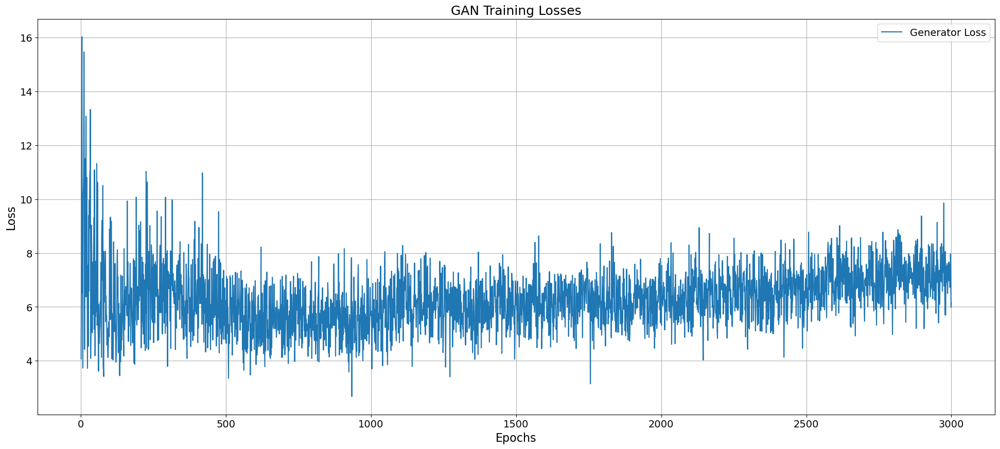

In [14]:
plt.figure(figsize=(24, 10))
plt.title('GAN Training Losses', fontsize=18)

# Plot generator loss
plt.plot(np.arange(1, len(gen_history) + 1), gen_history, label='Generator Loss')

plt.xlabel('Epochs', fontsize=16)
plt.ylabel('Loss', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(True)
plt.legend(fontsize=14)
plt.show()

#### Plots the discriminator loss over training epochs
#### Shows how well the discriminator distinguished real vs. fake images during training

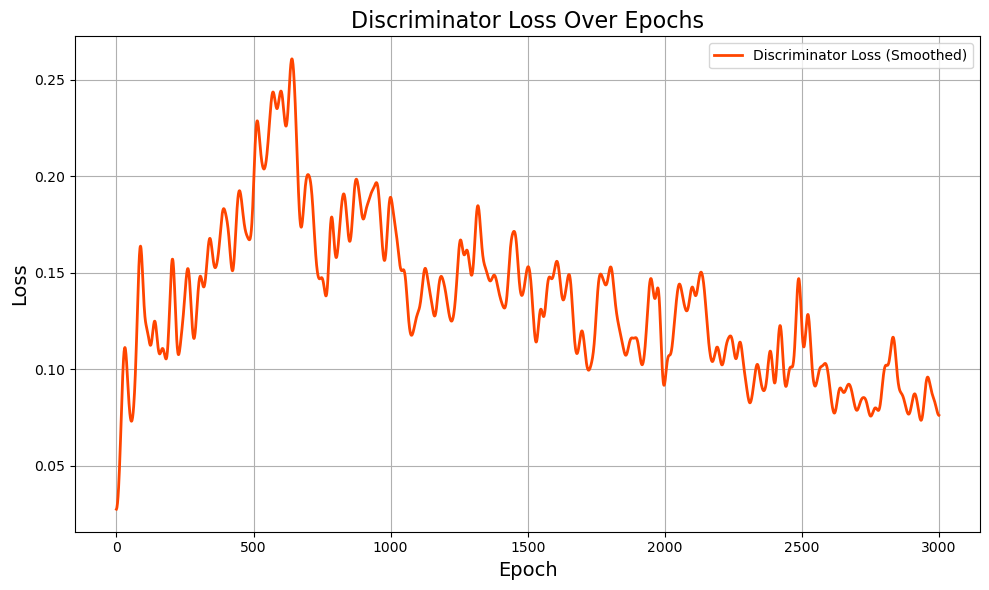

In [25]:
from scipy.ndimage import gaussian_filter1d

# Apply smoothing to reduce noise
smooth_disc = gaussian_filter1d(disc_history, sigma=10)

plt.figure(figsize=(10, 6))
plt.plot(smooth_disc, color='orangered', label='Discriminator Loss (Smoothed)', linewidth=2)
plt.title("Discriminator Loss Over Epochs", fontsize=16)
plt.xlabel("Epoch", fontsize=14)
plt.ylabel("Loss", fontsize=14)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

#### Uses the trained generator to create 16 images from the seed
#### Displays them in a 4×4 grid to evaluate visual quality after training
#### Below shows the final waffles generated 

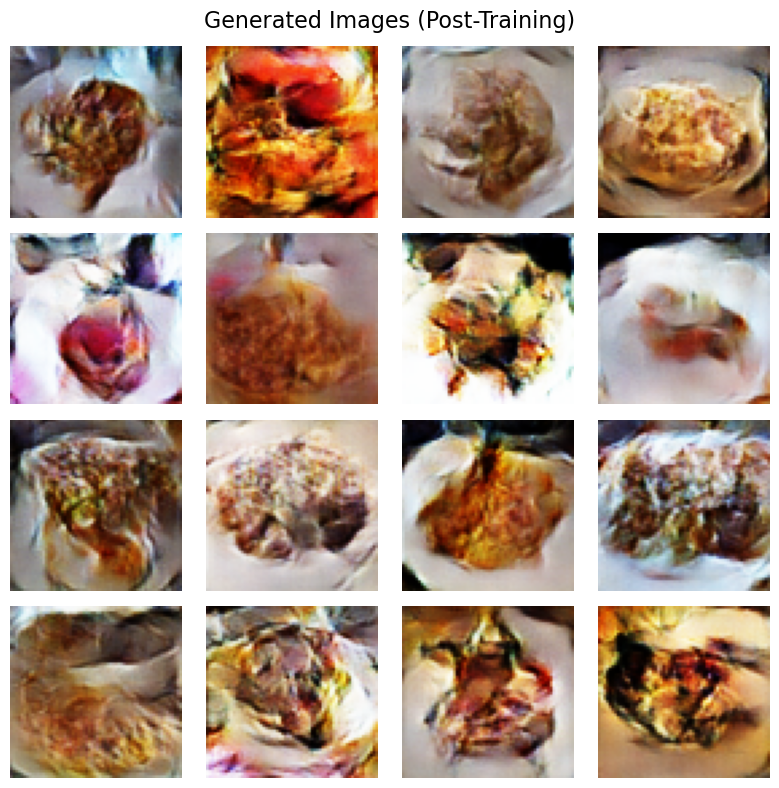

In [23]:
predictions = generator(seed, training=False)
images = (predictions * 127.5 + 127.5).numpy().astype(np.uint8)

plt.figure(figsize=(8, 8))
for i in range(16):
    plt.subplot(4, 4, i + 1)
    plt.imshow(images[i])
    plt.axis('off')
plt.suptitle("Generated Images (Post-Training)", fontsize=16)
plt.tight_layout()
plt.show()

## 6. Conclusions

#### In this project, we successfully implemented and trained a Deep Convolutional GAN (DCGAN) to generate waffle images.
#### While the generated outputs showed gradual improvements, some images still displayed visual artifacts, suggesting that further tuning could enhance quality.
#### Overall, this project demonstrated the potential of GANs for creative image generation tasks.